In [51]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt





Run lmm regression:

Pos_arousal = w_score + NAcc_TR_x + (subject)




- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Get peak, above 1 std above zero.
- Check onset NAcc and AIns for typo.

# Homemade functions

In [52]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [53]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-.95, fontsize=12)

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-1.05, fontsize=12)

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=.07, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)




In [54]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [55]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [56]:
def compute_and_plot_corrs(dataframe, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    #Compute PA correlations
    NAcc_PA_corr = pearsonr(dataframe[NAcc_key], dataframe[PA_key])
    AIns_PA_corr = pearsonr(dataframe[AIns_key], dataframe[PA_key])
    MPFC_PA_corr = pearsonr(dataframe[MPFC_key], dataframe[PA_key])

    #Compute NA correlations
    NAcc_NA_corr = pearsonr(dataframe[NAcc_key], dataframe[NA_key])
    AIns_NA_corr = pearsonr(dataframe[AIns_key], dataframe[NA_key])
    MPFC_NA_corr = pearsonr(dataframe[MPFC_key], dataframe[NA_key])

    #Compute W correlations
    NAcc_W_corr = pearsonr(dataframe[NAcc_key], dataframe[W_key])
    AIns_W_corr = pearsonr(dataframe[AIns_key], dataframe[W_key])
    MPFC_W_corr = pearsonr(dataframe[MPFC_key], dataframe[W_key])

    #Create a list with all the correlations
    corrs = [NAcc_PA_corr, NAcc_NA_corr, NAcc_W_corr, AIns_PA_corr, AIns_NA_corr, AIns_W_corr, MPFC_PA_corr, MPFC_NA_corr, MPFC_W_corr]

    # Print the correlations results.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal is: " + str(round(NAcc_PA_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal is: " + str(round(AIns_PA_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal is: " + str(round(MPFC_PA_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal is: " + str(round(NAcc_NA_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal is: " + str(round(AIns_NA_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal is: " + str(round(MPFC_NA_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores is: " + str(round(NAcc_W_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores is: " + str(round(AIns_W_corr[0], 5)) + " with a p-value of: " + str((AIns_W_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores is: " + str(round(MPFC_W_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_corr[1])))

    plot_correlations(dataframe, corrs, signal, title)

In [57]:
def compute_and_plot_both_corrs(dataframe_main, dataframe_C, dataframe_H, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    # Compute PA correlations for Comedy trailers.
    NAcc_PA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[PA_key])
    AIns_PA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[PA_key])
    MPFC_PA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[PA_key])

    # Compute PA correlations for Horror trailers.
    NAcc_PA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[PA_key])
    AIns_PA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[PA_key])
    MPFC_PA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[PA_key])

    # Compute NA correlations for Comedy trailers.
    NAcc_NA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[NA_key])
    AIns_NA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[NA_key])
    MPFC_NA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[NA_key])

    # Compute NA correlations for Horror trailers.
    NAcc_NA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[NA_key])
    AIns_NA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[NA_key])
    MPFC_NA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[NA_key])

    # Compute W correlations for Comedy trailers.
    NAcc_W_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[W_key])
    AIns_W_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[W_key])
    MPFC_W_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[W_key])

    # Compute W correlations for Horror trailers.
    NAcc_W_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[W_key])
    AIns_W_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[W_key])
    MPFC_W_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[W_key])

    # Create a list with all the correlations for Comedy trailers.
    corrs_comedy = [NAcc_PA_comedy_corr, NAcc_NA_comedy_corr, NAcc_W_comedy_corr, AIns_PA_comedy_corr, AIns_NA_comedy_corr, AIns_W_comedy_corr, MPFC_PA_comedy_corr, MPFC_NA_comedy_corr, MPFC_W_comedy_corr]

    # Create a list with all the correlations for Horror trailers.
    corrs_horror = [NAcc_PA_horror_corr, NAcc_NA_horror_corr, NAcc_W_horror_corr, AIns_PA_horror_corr, AIns_NA_horror_corr, AIns_W_horror_corr, MPFC_PA_horror_corr, MPFC_NA_horror_corr, MPFC_W_horror_corr]
    
    # Print the correlations results for Comedy trailers.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal for Comedy trailers is: " + str(round(NAcc_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Comedy trailers is: " + str(round(AIns_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Comedy trailers is: " + str(round(MPFC_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Comedy trailers is: " + str(round(NAcc_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Comedy trailers is: " + str(round(AIns_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Comedy trailers is: " + str(round(MPFC_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Comedy trailers is: " + str(round(NAcc_W_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Comedy trailers is: " + str(round(AIns_W_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_W_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Comedy trailers is: " + str(round(MPFC_W_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_comedy_corr[1])))

    # Print the correlations results for Horror trailers.
    print("\n\nThe correlation between " + str(NAcc_key) + " activation and positive arousal for Horror trailers is: " + str(round(NAcc_PA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Horror trailers is: " + str(round(AIns_PA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Horror trailers is: " + str(round(MPFC_PA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Horror trailers is: " + str(round(NAcc_NA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Horror trailers is: " + str(round(AIns_NA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Horror trailers is: " + str(round(MPFC_NA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Horror trailers is: " + str(round(NAcc_W_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Horror trailers is: " + str(round(AIns_W_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_W_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Horror trailers is: " + str(round(MPFC_W_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_horror_corr[1])))

    # Plot the correlations for both types of trailers.
    plot_correlations3_bothTrailers(dataframe_main, signal, corrs_comedy, corrs_horror, title)

# Clean data

In [58]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [59]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
print("The un-cleaned shape of the dataframe is: ", all_subs_events_df.shape)
all_subs_events_df.head()

The un-cleaned shape of the dataframe is:  (899, 71)


,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_delta_peak_avg,NAcc_narrow_delta_peak,AIns_narrow_delta_peak,MPFC_narrow_delta_peak,NAcc_narrow_delta_peak_avg,AIns_narrow_delta_peak_avg,MPFC_narrow_delta_peak_avg,NAcc_ISC,AIns_ISC,MPFC_ISC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.164120,...,-0.020669,0.015275,0.020811,0.009621,0.008347,0.013826,0.008049,0.280927,0.011645,0.182156
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.299553,...,0.006863,0.006605,0.005311,0.005707,0.004566,0.007960,0.003476,0.162430,0.017599,0.266761
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.137040,...,-0.122911,0.005237,0.008275,0.010995,0.002670,-0.000150,0.006393,-0.153892,0.222329,0.086115
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.123153,...,0.000000,0.025231,0.011839,0.002295,0.016606,0.002752,0.005003,0.141917,-0.099550,0.163633
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.137746,...,0.004604,0.018573,0.002831,0.008994,0.011279,0.001494,0.004299,0.015213,0.052826,-0.102410


In [60]:
drop_threshold = 2.4

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] > -drop_threshold]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] > -drop_threshold]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# Drop outliers from MPFC.
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] > -drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] > -drop_threshold]
print("The shape of the dataframe after dropping 'MPFC' outliers is: ", all_subs_events_df.shape)

The shape of the dataframe after dropping 'NAcc' outliers is:  (894, 71)
The shape of the dataframe after dropping 'AIns' outliers is:  (893, 71)
The shape of the dataframe after dropping 'MPFC' outliers is:  (893, 71)


In [61]:
""" 
# Drop outliers from positive arousal. 
print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from negative arousal.
all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from watch score.

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.6]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] < 0.6]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset"] > -0.6]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset"] < 0.58]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -.8]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# Drop outliers from MPFC.
all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle"] < 1.2]
all_subs_events_df.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_rm_outliers.csv')

# Drop outliers from delta peaks.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] < 100]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] > -100]
"""



' \n# Drop outliers from positive arousal. \nprint("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)\nall_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]\nprint("The shape of the dataframe after dropping \'positive arousal\' outliers is: ", all_subs_events_df.shape)\n\n# Drop outliers from negative arousal.\nall_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]\nprint("The shape of the dataframe after dropping \'negative arousal\' outliers is: ", all_subs_events_df.shape)\n\n# Drop outliers from watch score.\n\n# Drop outliers from NAcc.\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]\nall_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.6]\nall_subs_events_df = all_subs

In [62]:
# Separate files based on type of trailer. 
all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Comedy.csv')


In [63]:
all_subs_events_horror.head()

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_delta_peak_avg,NAcc_narrow_delta_peak,AIns_narrow_delta_peak,MPFC_narrow_delta_peak,NAcc_narrow_delta_peak_avg,AIns_narrow_delta_peak_avg,MPFC_narrow_delta_peak_avg,NAcc_ISC,AIns_ISC,MPFC_ISC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.164120,...,-0.020669,0.015275,0.020811,0.009621,0.008347,0.013826,0.008049,0.280927,0.011645,0.182156
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.299553,...,0.006863,0.006605,0.005311,0.005707,0.004566,0.007960,0.003476,0.162430,0.017599,0.266761
2,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.123153,...,0.000000,0.025231,0.011839,0.002295,0.016606,0.002752,0.005003,0.141917,-0.099550,0.163633
3,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.137746,...,0.004604,0.018573,0.002831,0.008994,0.011279,0.001494,0.004299,0.015213,0.052826,-0.102410
4,sub-01,rh9,Horror,332.0,362.0,30,2,2,2,0.099583,...,0.009410,0.006886,0.012572,0.001086,0.004810,0.009093,0.005918,-0.779319,0.472795,-0.083872


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.8368 with a p-value of: 2.485949993907281e-235
The correlation between W_score and Neg_arousal is: -0.6511 with a p-value of: 8.223153999471374e-109


Text(-0.8, -2, 'r= -0.6511; p-value: 8.223153999471374e-109')

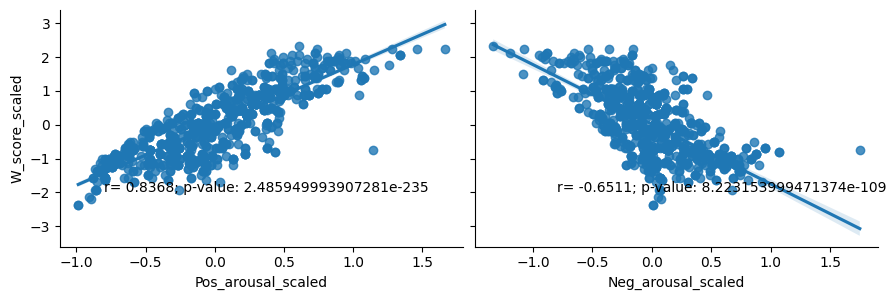

In [64]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

W_PA_NA_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    height=3,
    aspect=1.5)

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 0].text(s=W_PA_string, x=-.8, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 1].text(s=W_NA_string, x=-.8, y=-2, fontsize=10)


In [65]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_NA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between W_score and Neg_arousal for comedy trailers is: " + str(round(W_NA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_NA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_NA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between W_score and Neg_arousal for horror trailers is: " + str(round(W_NA_horror_corr[0], 4)) + " with a p-value of: " + str((W_NA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: 0.9061 with a p-value of: 1.0496468895391832e-168
The correlation between W_score and Neg_arousal for comedy trailers is: -0.6692 with a p-value of: 1.6969205230839534e-59

The correlation between W_score and Pos_arousal for horror trailers is: 0.8018 with a p-value of: 4.016551992032398e-101
The correlation between W_score and Neg_arousal for horror trailers is: -0.6158 with a p-value of: 8.27689806690928e-48


Text(-0.8, -2.5, 'H r= 0.8018; p-value: 4.016551992032398e-101')

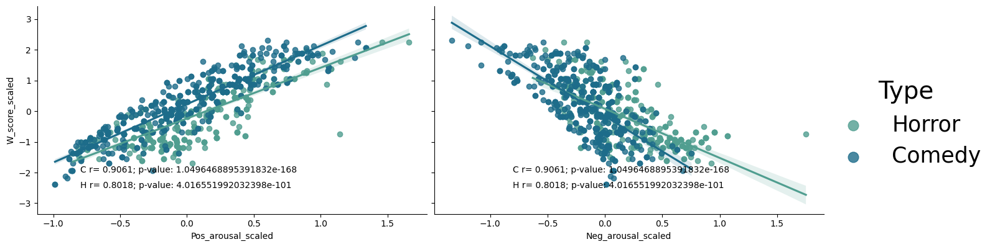

In [66]:
W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    hue="Type",
    height=4,
    aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

<Axes: xlabel='Type', ylabel='Neg_arousal_scaled'>

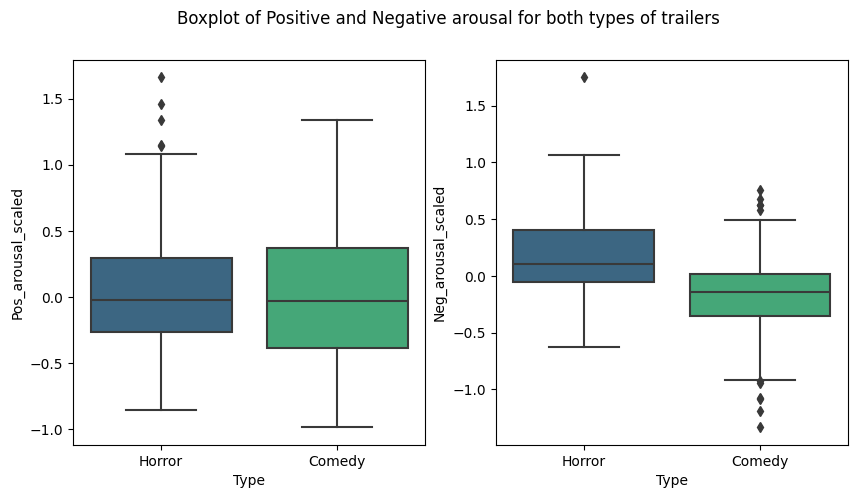

In [67]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])


<Axes: xlabel='Pos_arousal_scaled', ylabel='Count'>

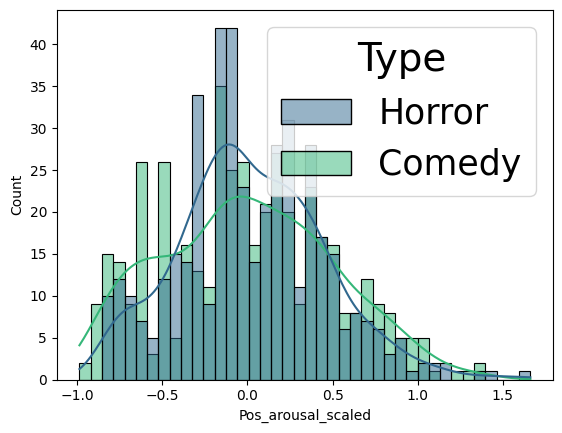

In [68]:
sns.histplot(data=all_subs_events_df, x="Pos_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)
#sns.histplot(data=all_subs_events_df, x="Neg_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)



<Axes: xlabel='W_score_scaled', ylabel='Count'>

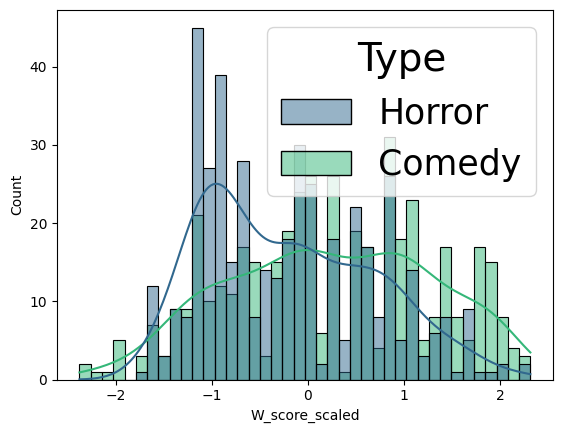

In [69]:
sns.histplot(data=all_subs_events_df, x="W_score_scaled", hue="Type", kde=True, palette="viridis", bins=40)

In [70]:
#sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")

## Neural Activation Whole Average 

The correlation between NAcc_whole activation and positive arousal is: 0.03715 with a p-value of: 0.267478900206557
The correlation between AIns_whole activation and positive arousal is: 0.06096 with a p-value of: 0.06861333972244081
The correlation between MPFC_whole activation and positive arousal is: -0.02072 with a p-value of: 0.5362722771907085

The correlation between NAcc_whole activation and negative arousal is: 0.02329 with a p-value of: 0.48704838832086866
The correlation between AIns_whole activation and negative arousal is: 0.15964 with a p-value of: 1.6296583854163016e-06
The correlation between MPFC_whole activation and negative arousal is: -0.02633 with a p-value of: 0.432008168892905

The correlation between NAcc_whole activation and watch scores is: 0.01602 with a p-value of: 0.632558979224252
The correlation between AIns_whole activation and watch scores is: -0.03737 with a p-value of: 0.26461128001868744
The correlation between MPFC_whole activation and watch scores 

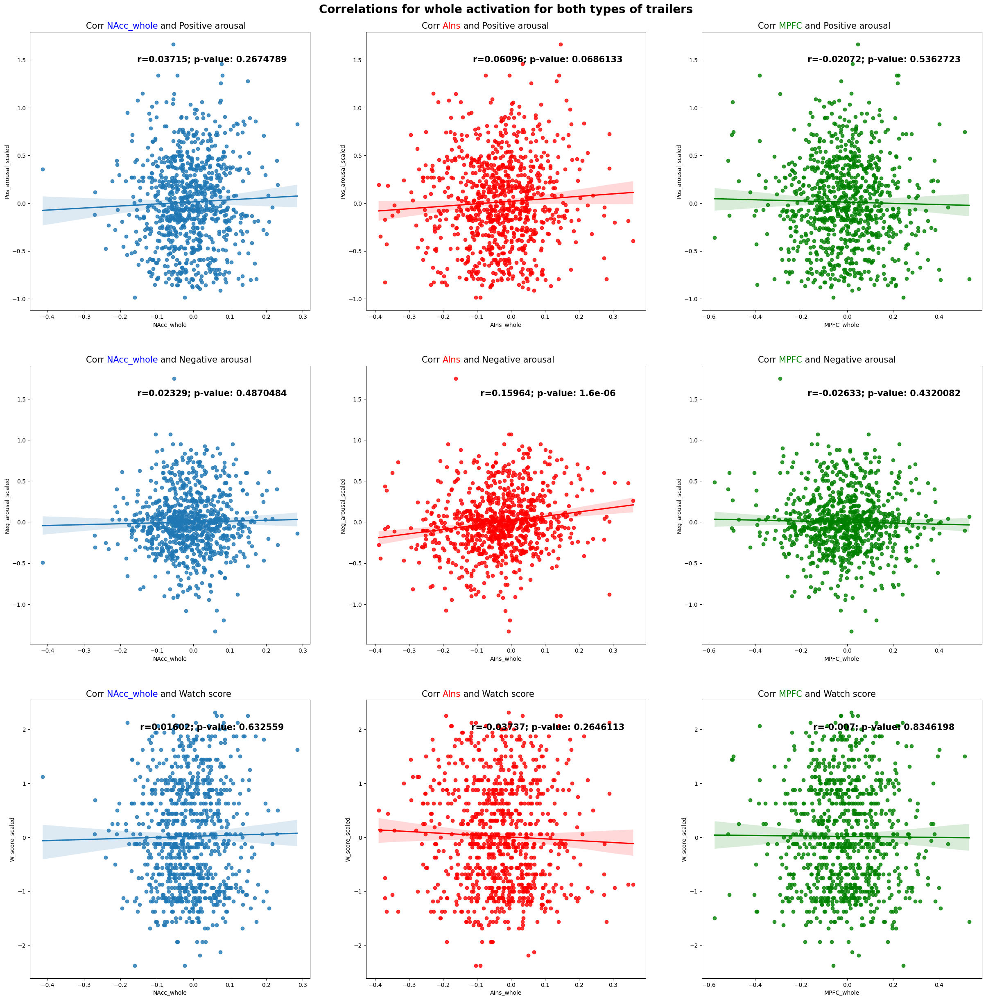

In [71]:
test_title = "Correlations for whole activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "whole", test_title)

The correlation between NAcc_whole activation and positive arousal for Comedy trailers is: 0.0731 with a p-value of: 0.12235396453050494
The correlation between AIns_whole activation and positive arousal for Comedy trailers is: 0.10136 with a p-value of: 0.031951338368830615
The correlation between MPFC_whole activation and positive arousal for Comedy trailers is: -0.01551 with a p-value of: 0.7433483858875399

The correlation between NAcc_whole activation and negative arousal for Comedy trailers is: -0.02796 with a p-value of: 0.555060636916377
The correlation between AIns_whole activation and negative arousal for Comedy trailers is: 0.02839 with a p-value of: 0.5489131991952915
The correlation between MPFC_whole activation and negative arousal for Comedy trailers is: -0.00015 with a p-value of: 0.9974706457886849

The correlation between NAcc_whole activation and watch scores for Comedy trailers is: 0.05966 with a p-value of: 0.20756372696074593
The correlation between AIns_whole act

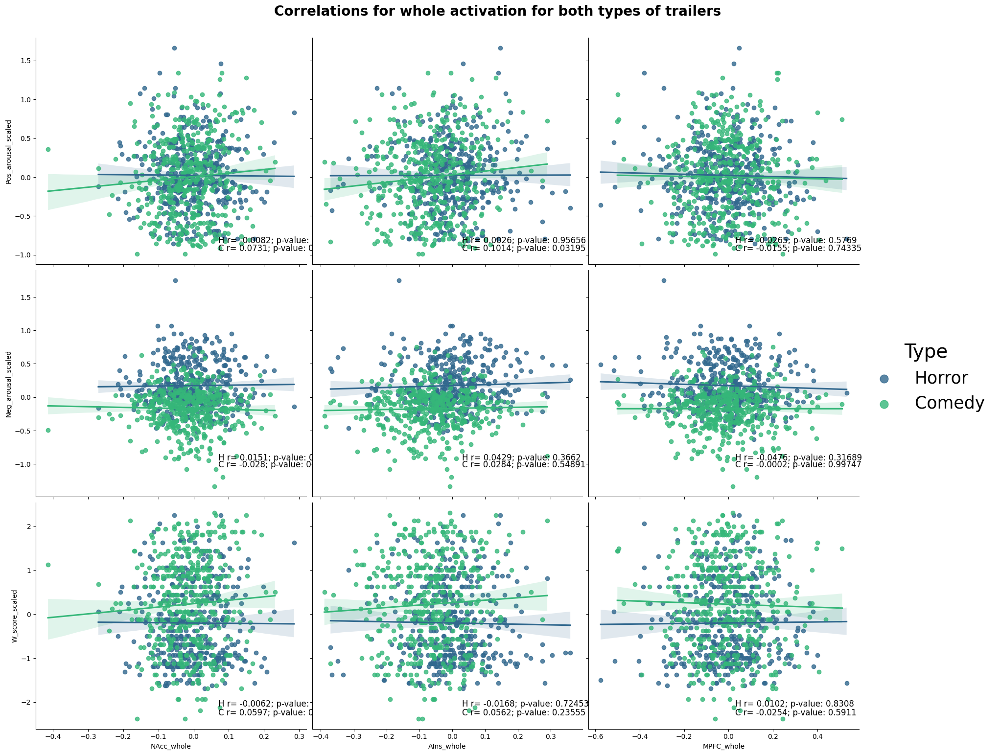

In [72]:

compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "whole", "Correlations for whole activation for both types of trailers")


## Neural Activation Offset 

The correlation between NAcc_offset activation and positive arousal is: 0.02636 with a p-value of: 0.4314829826376188
The correlation between AIns_offset activation and positive arousal is: 0.02297 with a p-value of: 0.4929979737672512
The correlation between MPFC_offset activation and positive arousal is: -0.0172 with a p-value of: 0.6077956939518838

The correlation between NAcc_offset activation and negative arousal is: -0.01791 with a p-value of: 0.5930382581441441
The correlation between AIns_offset activation and negative arousal is: 0.12577 with a p-value of: 0.00016441791067668305
The correlation between MPFC_offset activation and negative arousal is: -0.02949 with a p-value of: 0.37868779987502654

The correlation between NAcc_offset activation and watch scores is: 0.02207 with a p-value of: 0.510049798465003
The correlation between AIns_offset activation and watch scores is: -0.06329 with a p-value of: 0.05867551170791084
The correlation between MPFC_offset activation and wat

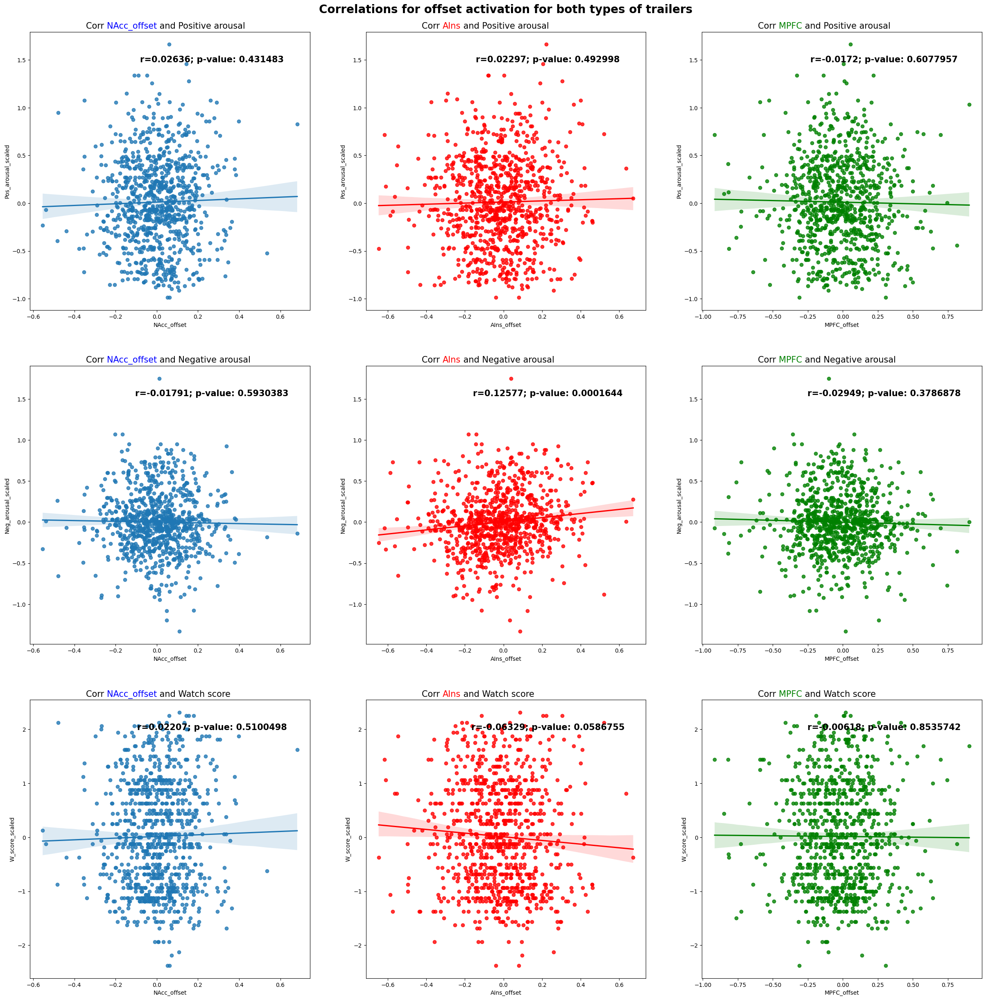

In [73]:
offset_title = "Correlations for offset activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "offset", offset_title)

The correlation between NAcc_offset activation and positive arousal for Comedy trailers is: -0.02242 with a p-value of: 0.6359448591373819
The correlation between AIns_offset activation and positive arousal for Comedy trailers is: 0.02972 with a p-value of: 0.5303123525594827
The correlation between MPFC_offset activation and positive arousal for Comedy trailers is: -0.01221 with a p-value of: 0.7966951744835936

The correlation between NAcc_offset activation and negative arousal for Comedy trailers is: -0.01037 with a p-value of: 0.8267882288333153
The correlation between AIns_offset activation and negative arousal for Comedy trailers is: 0.01164 with a p-value of: 0.8059276190280137
The correlation between MPFC_offset activation and negative arousal for Comedy trailers is: 0.02416 with a p-value of: 0.6100302786555697

The correlation between NAcc_offset activation and watch scores for Comedy trailers is: -0.02007 with a p-value of: 0.6717485018321464
The correlation between AIns_off

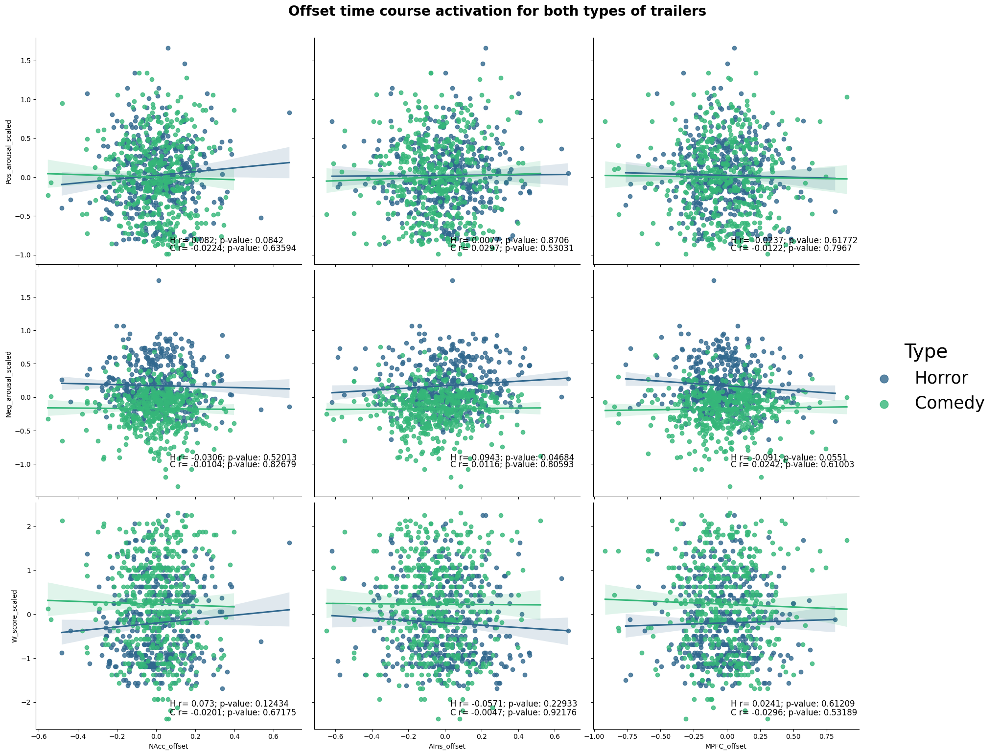

In [74]:
offset_title = 'Offset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "offset", offset_title)


# Neural activation middle

The correlation between NAcc_middle activation and positive arousal is: -0.00902 with a p-value of: 0.787903982614616
The correlation between AIns_middle activation and positive arousal is: 0.04425 with a p-value of: 0.18647504332025303
The correlation between MPFC_middle activation and positive arousal is: -0.04772 with a p-value of: 0.15417174713584803

The correlation between NAcc_middle activation and negative arousal is: 0.03401 with a p-value of: 0.31006718933759564
The correlation between AIns_middle activation and negative arousal is: 0.11935 with a p-value of: 0.00035131239409614667
The correlation between MPFC_middle activation and negative arousal is: -0.00573 with a p-value of: 0.8643090040505739

The correlation between NAcc_middle activation and watch scores is: -0.01984 with a p-value of: 0.5538043753214104
The correlation between AIns_middle activation and watch scores is: -0.02032 with a p-value of: 0.5442651832707555
The correlation between MPFC_middle activation and 

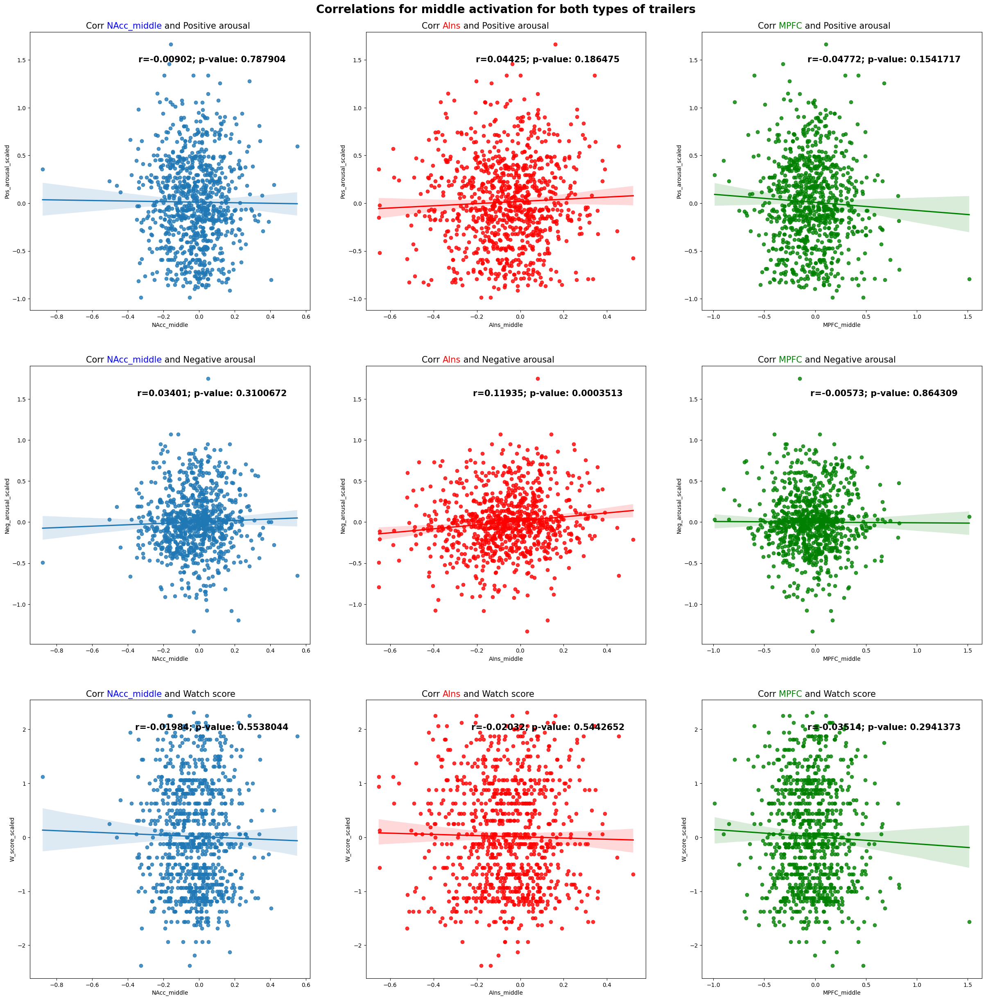

In [75]:
middle_title = "Correlations for middle activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "middle", middle_title)

The correlation between NAcc_middle activation and positive arousal for Comedy trailers is: 0.01291 with a p-value of: 0.7852090315586604
The correlation between AIns_middle activation and positive arousal for Comedy trailers is: 0.03653 with a p-value of: 0.44056594499638396
The correlation between MPFC_middle activation and positive arousal for Comedy trailers is: -0.03201 with a p-value of: 0.4991921182230231

The correlation between NAcc_middle activation and negative arousal for Comedy trailers is: -0.04186 with a p-value of: 0.37672744162875355
The correlation between AIns_middle activation and negative arousal for Comedy trailers is: 0.04378 with a p-value of: 0.3552279796915565
The correlation between MPFC_middle activation and negative arousal for Comedy trailers is: -0.05461 with a p-value of: 0.24873216243755297

The correlation between NAcc_middle activation and watch scores for Comedy trailers is: 0.02661 with a p-value of: 0.5742860138845414
The correlation between AIns_m

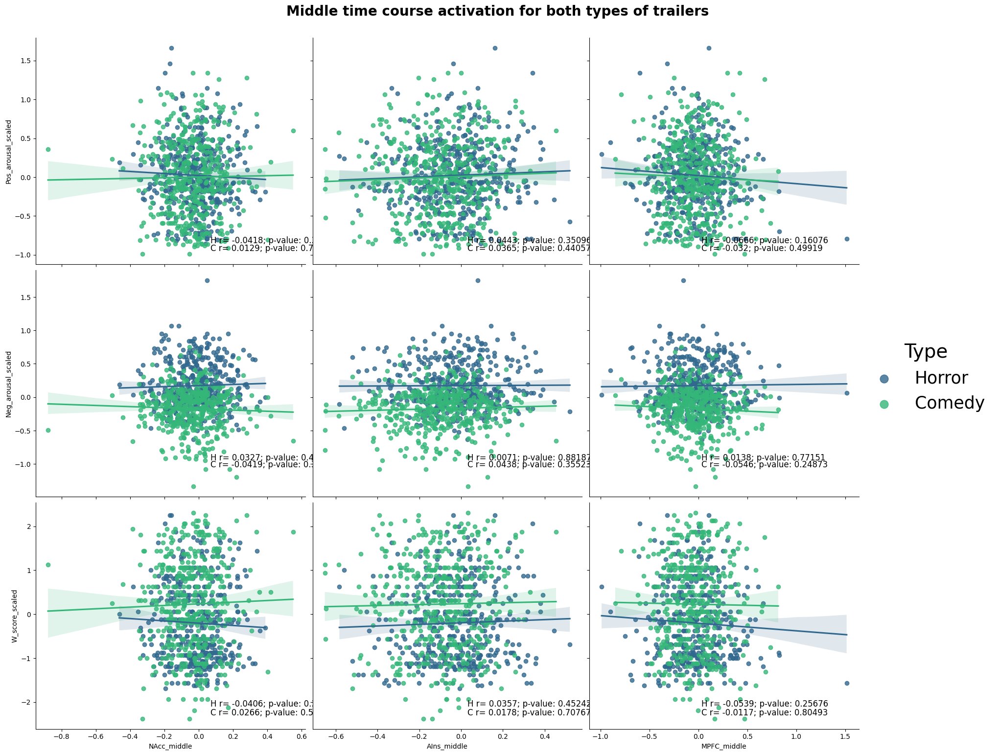

In [76]:
middle_title = 'Middle time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "middle", middle_title)

## Neural activation onset

In [77]:
onset_title = "Correlations for onset activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "onset", onset_title)

The correlation between NAcc_onset activation and positive arousal is: 0.04264 with a p-value of: 0.2029695416831765
The correlation between AIns_onset activation and positive arousal is: 0.04388 with a p-value of: 0.19020143547939963
The correlation between MPFC_onset activation and positive arousal is: 0.02742 with a p-value of: 0.41307125073446743

The correlation between NAcc_onset activation and negative arousal is: 0.0214 with a p-value of: 0.522969765782549
The correlation between AIns_onset activation and negative arousal is: 0.04319 with a p-value of: 0.19721404138745935
The correlation between MPFC_onset activation and negative arousal is: -0.01433 with a p-value of: 0.6689416983227379

The correlation between NAcc_onset activation and watch scores is: 0.02343 with a p-value of: 0.4844581270465343
The correlation between AIns_onset activation and watch scores is: 0.01733 with a p-value of: 0.6049480406271839
The correlation between MPFC_onset activation and watch scores is: 0

The correlation between NAcc_onset activation and positive arousal for Comedy trailers is: 0.12821 with a p-value of: 0.006581528690417943
The correlation between AIns_onset activation and positive arousal for Comedy trailers is: 0.11392 with a p-value of: 0.015849672374971584
The correlation between MPFC_onset activation and positive arousal for Comedy trailers is: 0.01571 with a p-value of: 0.7402289674260943

The correlation between NAcc_onset activation and negative arousal for Comedy trailers is: 0.0061 with a p-value of: 0.8975425463651087
The correlation between AIns_onset activation and negative arousal for Comedy trailers is: -0.00467 with a p-value of: 0.9215408022596075
The correlation between MPFC_onset activation and negative arousal for Comedy trailers is: 0.03034 with a p-value of: 0.5218411989945062

The correlation between NAcc_onset activation and watch scores for Comedy trailers is: 0.09007 with a p-value of: 0.05679698722933125
The correlation between AIns_onset act

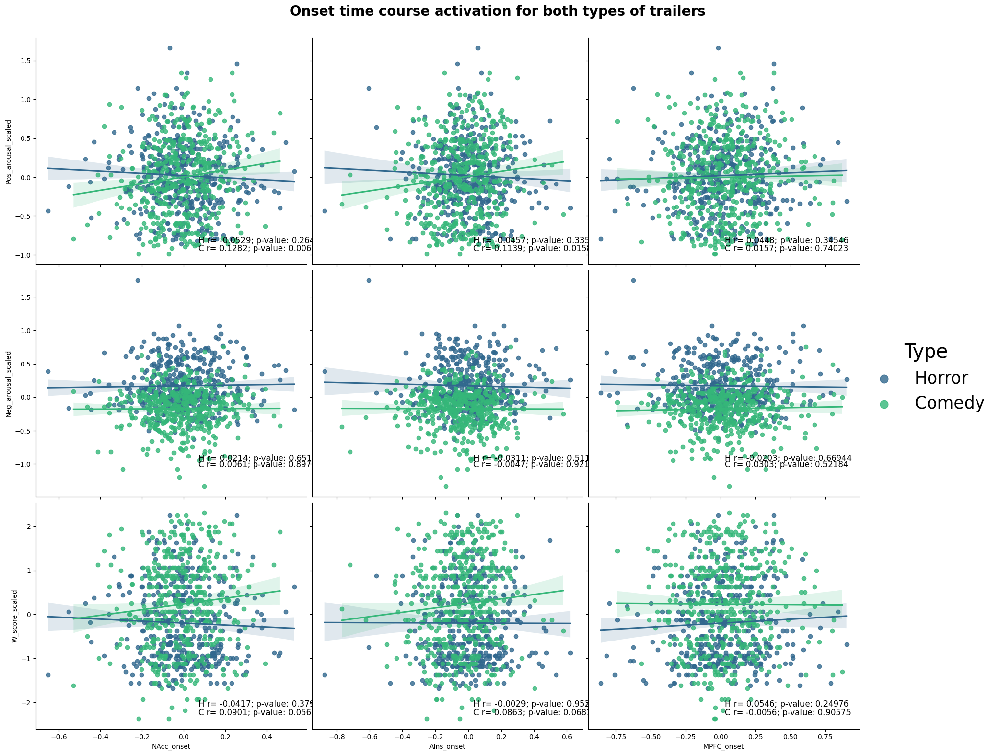

In [ ]:
onset_title = 'Onset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "onset", onset_title)

## Peak Max

The correlation between NAcc_pos_peak activation and positive arousal is: 0.02934 with a p-value of: 0.3809288431496566
The correlation between AIns_pos_peak activation and positive arousal is: 0.04842 with a p-value of: 0.14802982474430681
The correlation between MPFC_pos_peak activation and positive arousal is: 2e-05 with a p-value of: 0.9994147753658517

The correlation between NAcc_pos_peak activation and negative arousal is: 0.04877 with a p-value of: 0.14508984412284737
The correlation between AIns_pos_peak activation and negative arousal is: 0.09686 with a p-value of: 0.0037462944290075927
The correlation between MPFC_pos_peak activation and negative arousal is: 0.00071 with a p-value of: 0.983085693801157

The correlation between NAcc_pos_peak activation and watch scores is: -0.00173 with a p-value of: 0.9587829471645719
The correlation between AIns_pos_peak activation and watch scores is: -0.02563 with a p-value of: 0.4440004323245872
The correlation between MPFC_pos_peak acti

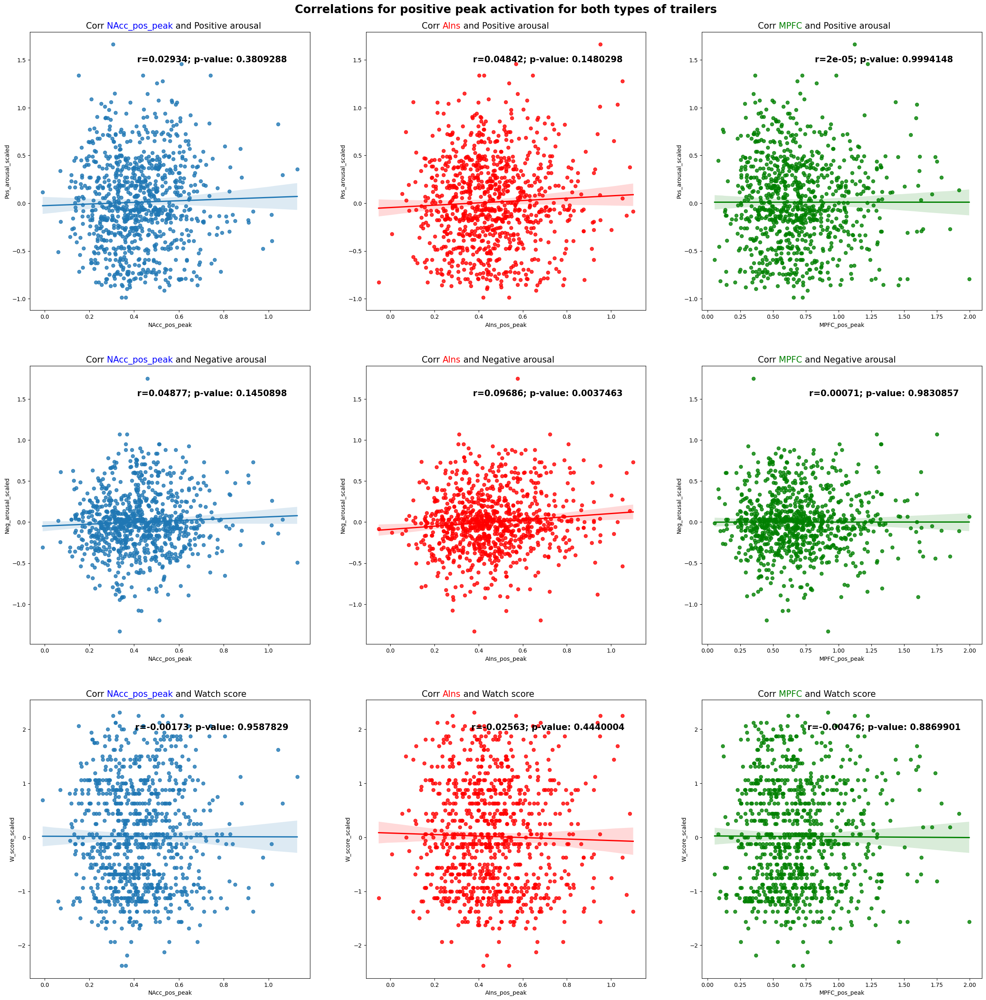

In [ ]:
pos_peak_title = "Correlations for positive peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "pos_peak", pos_peak_title)

The correlation between NAcc_pos_peak activation and positive arousal for Comedy trailers is: 0.07643 with a p-value of: 0.10618232031651903
The correlation between AIns_pos_peak activation and positive arousal for Comedy trailers is: 0.00839 with a p-value of: 0.8594260253578909
The correlation between MPFC_pos_peak activation and positive arousal for Comedy trailers is: 0.02829 with a p-value of: 0.5503074938979851

The correlation between NAcc_pos_peak activation and negative arousal for Comedy trailers is: -0.00632 with a p-value of: 0.8938603866016025
The correlation between AIns_pos_peak activation and negative arousal for Comedy trailers is: -0.00508 with a p-value of: 0.9146264229013094
The correlation between MPFC_pos_peak activation and negative arousal for Comedy trailers is: 0.00353 with a p-value of: 0.9405462460521506

The correlation between NAcc_pos_peak activation and watch scores for Comedy trailers is: 0.05916 with a p-value of: 0.21137669701591758
The correlation be

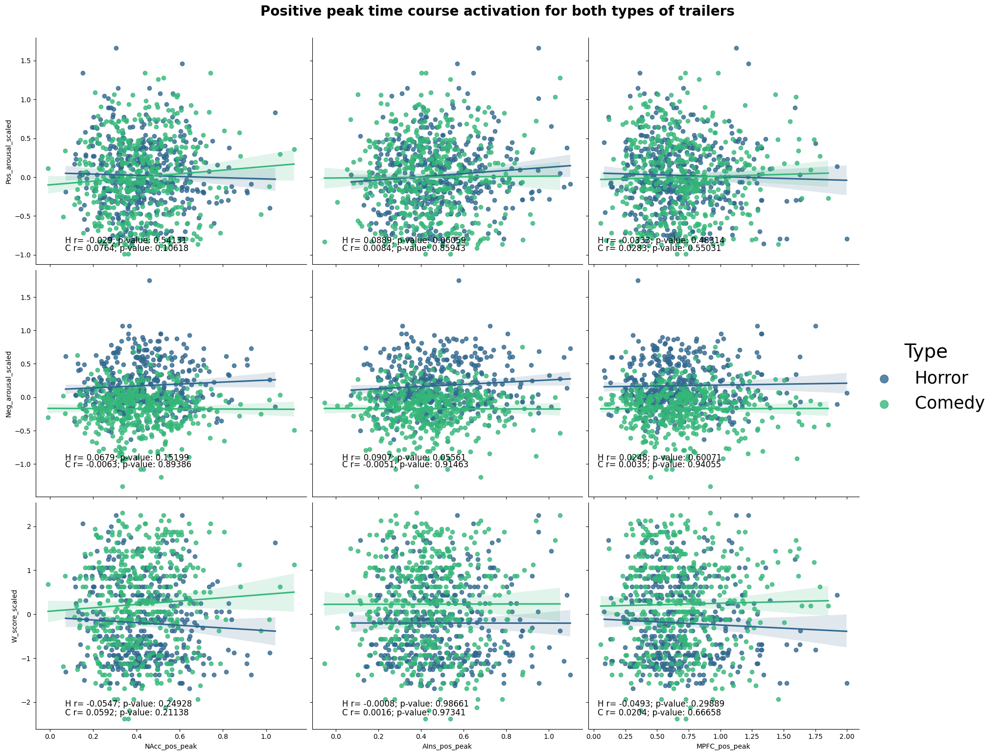

In [ ]:
pos_peak_title = 'Positive peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "pos_peak", pos_peak_title)

## Peak min

The correlation between NAcc_neg_peak activation and positive arousal is: 0.01598 with a p-value of: 0.6331491604380131
The correlation between AIns_neg_peak activation and positive arousal is: 0.00715 with a p-value of: 0.831062254428555
The correlation between MPFC_neg_peak activation and positive arousal is: 0.01633 with a p-value of: 0.6257592405575884

The correlation between NAcc_neg_peak activation and negative arousal is: -0.0049 with a p-value of: 0.8836948667692803
The correlation between AIns_neg_peak activation and negative arousal is: 0.10098 with a p-value of: 0.0025054977464203545
The correlation between MPFC_neg_peak activation and negative arousal is: -0.0189 with a p-value of: 0.5725025630526162

The correlation between NAcc_neg_peak activation and watch scores is: 0.01432 with a p-value of: 0.6689791484907578
The correlation between AIns_neg_peak activation and watch scores is: -0.04745 with a p-value of: 0.15628188728821266
The correlation between MPFC_neg_peak acti

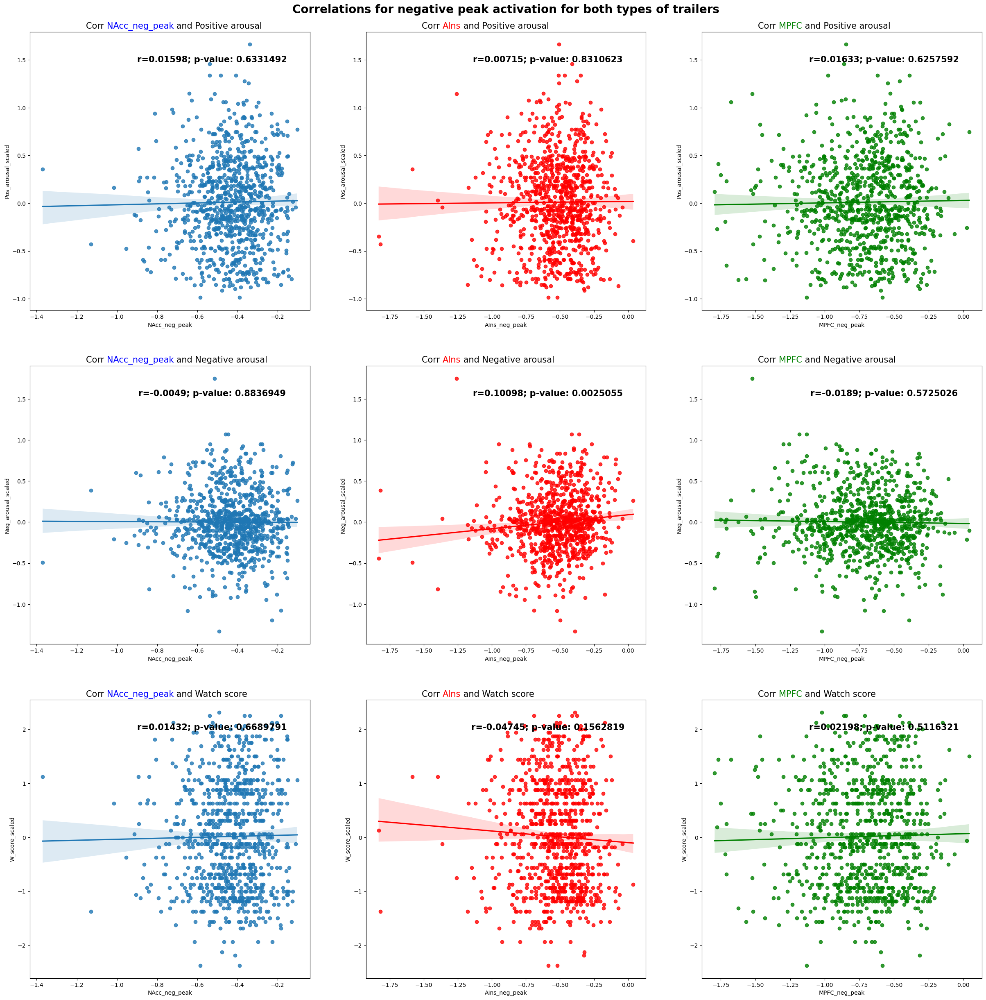

In [ ]:
neg_peak_title = "Correlations for negative peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_df, "neg_peak", neg_peak_title)

The correlation between NAcc_neg_peak activation and positive arousal for Comedy trailers is: 0.03159 with a p-value of: 0.5047613909493301
The correlation between AIns_neg_peak activation and positive arousal for Comedy trailers is: 0.08185 with a p-value of: 0.0835538828184043
The correlation between MPFC_neg_peak activation and positive arousal for Comedy trailers is: -0.02154 with a p-value of: 0.6492907564958169

The correlation between NAcc_neg_peak activation and negative arousal for Comedy trailers is: 0.03873 with a p-value of: 0.4134535554033991
The correlation between AIns_neg_peak activation and negative arousal for Comedy trailers is: 0.05792 with a p-value of: 0.2211558691838545
The correlation between MPFC_neg_peak activation and negative arousal for Comedy trailers is: 0.05618 with a p-value of: 0.23534618254124576

The correlation between NAcc_neg_peak activation and watch scores for Comedy trailers is: 0.00208 with a p-value of: 0.9649437988189865
The correlation betw

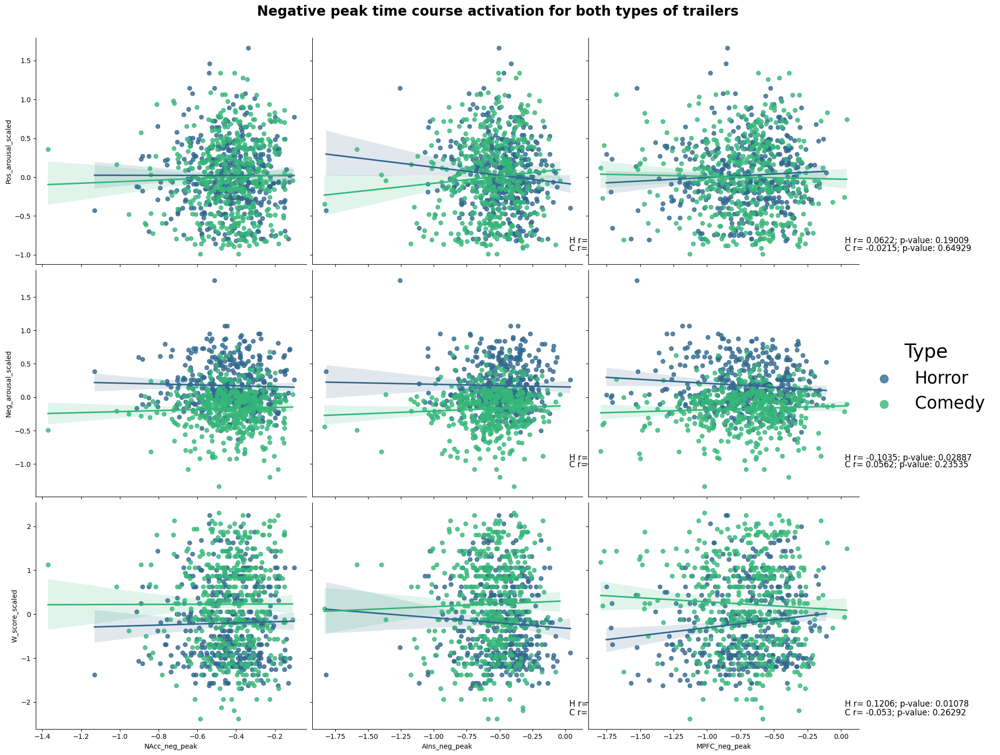

In [ ]:
neg_peak_title = 'Negative peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "neg_peak", neg_peak_title)

## Positive peak (slope) 

The correlation between NAcc_slope_peak activation and positive arousal is: 0.04354 with a p-value of: 0.3535605118646937
The correlation between AIns_slope_peak activation and positive arousal is: 0.0776 with a p-value of: 0.09792953568611851
The correlation between MPFC_slope_peak activation and positive arousal is: -0.06333 with a p-value of: 0.17701054068434494

The correlation between NAcc_slope_peak activation and negative arousal is: 0.07426 with a p-value of: 0.11329466228126968
The correlation between AIns_slope_peak activation and negative arousal is: -0.00832 with a p-value of: 0.8593538808551405
The correlation between MPFC_slope_peak activation and negative arousal is: 0.03911 with a p-value of: 0.404733176688092

The correlation between NAcc_slope_peak activation and watch scores is: -0.00771 with a p-value of: 0.8695441492704692
The correlation between AIns_slope_peak activation and watch scores is: 0.06155 with a p-value of: 0.18950297624060164
The correlation between M

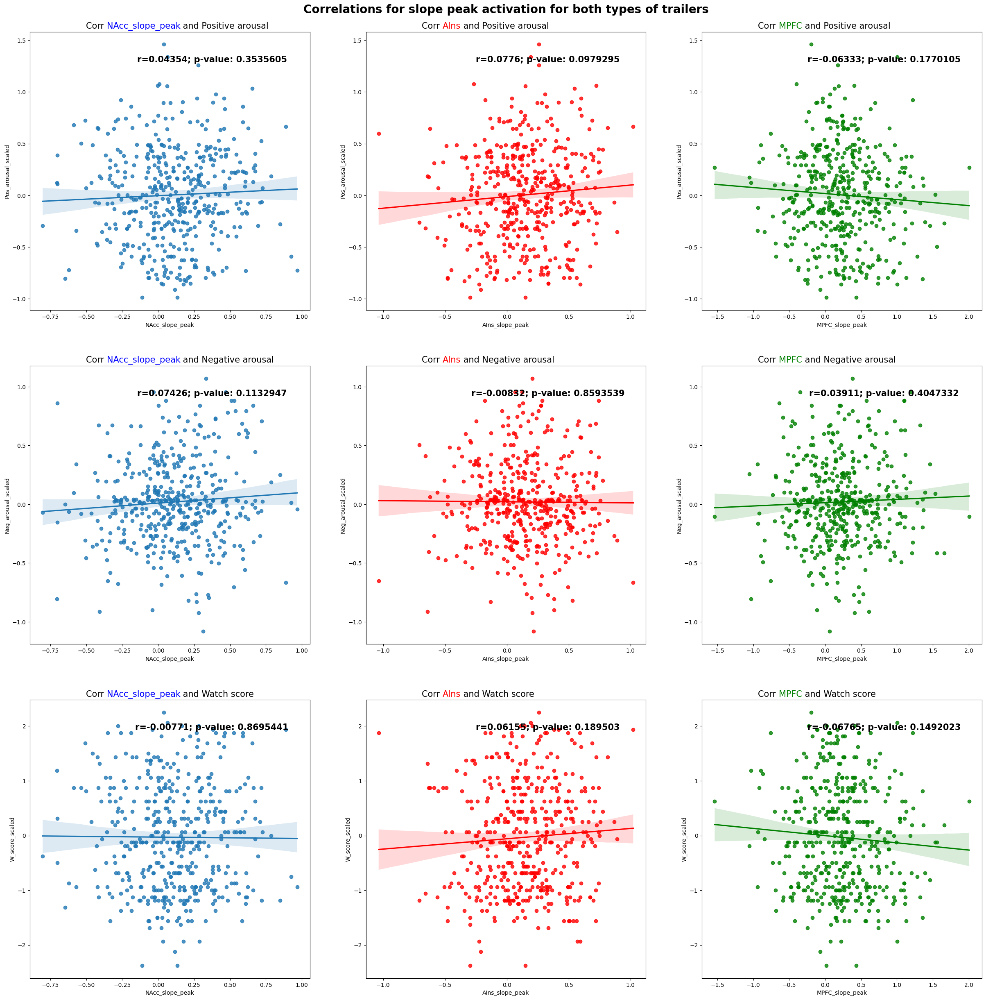

In [ ]:
# Drop outliers from delta peaks.
all_subs_events_slope_df = all_subs_events_df[(all_subs_events_df["NAcc_slope_peak"] != 0) & (all_subs_events_df["AIns_slope_peak"] != 0) & (all_subs_events_df["MPFC_slope_peak"] != 0)]
all_subs_events_slope_horror_df = all_subs_events_slope_df[all_subs_events_slope_df["Type"] == "Horror"]
all_subs_events_slope_comedy_df = all_subs_events_slope_df[all_subs_events_slope_df["Type"] == "Comedy"]


pos_slope_peak_title = "Correlations for slope peak activation for both types of trailers"
compute_and_plot_corrs(all_subs_events_slope_df, "slope_peak", pos_slope_peak_title)

The correlation between NAcc_slope_peak activation and positive arousal for Comedy trailers is: 0.08823 with a p-value of: 0.1912929494225081
The correlation between AIns_slope_peak activation and positive arousal for Comedy trailers is: 0.04722 with a p-value of: 0.4849249922634042
The correlation between MPFC_slope_peak activation and positive arousal for Comedy trailers is: -0.06028 with a p-value of: 0.3724639313297774

The correlation between NAcc_slope_peak activation and negative arousal for Comedy trailers is: -0.00919 with a p-value of: 0.8919040968480008
The correlation between AIns_slope_peak activation and negative arousal for Comedy trailers is: 0.02436 with a p-value of: 0.7187859953425654
The correlation between MPFC_slope_peak activation and negative arousal for Comedy trailers is: 0.0259 with a p-value of: 0.701797945607004

The correlation between NAcc_slope_peak activation and watch scores for Comedy trailers is: 0.07044 with a p-value of: 0.29718207209887454
The cor

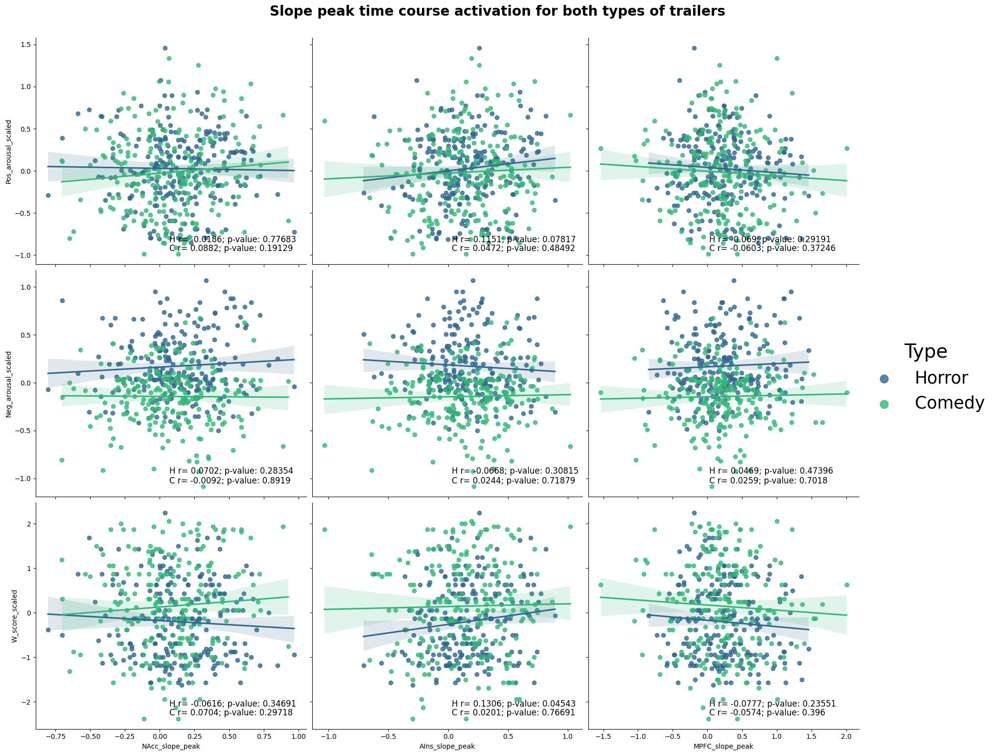

In [ ]:
pos_slope_peak_title = 'Slope peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_subs_events_slope_df, all_subs_events_slope_comedy_df, all_subs_events_slope_horror_df, "slope_peak", pos_slope_peak_title)


## Narrow slope peak 

In [ ]:
#narrow_slope_peak_title = "Correlations for narrow slope peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "narrow_slope_peak", narrow_slope_peak_title)

In [ ]:
#narrow_slope_peak_title = 'Narrow slope peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "narrow_slope_peak", narrow_slope_peak_title)

## Positive peak (delta)

In [ ]:
#delta_peak_title = "Correlations for delta peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "delta_peak", delta_peak_title)

In [ ]:
#delta_peak_title = 'Delta peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "delta_peak", delta_peak_title)

## Narrow delta peak 

In [ ]:
#narrow_delta_peak_title = "Correlations for narrow delta peak activation for both types of trailers"
#compute_and_plot_corrs(all_subs_events_df, "narrow_delta_peak", narrow_delta_peak_title)

In [ ]:
#narrow_delta_peak_title = 'Narrow delta peak time course activation for both types of trailers'
#compute_and_plot_both_corrs(all_subs_events_df, all_subs_events_comedy, all_subs_events_horror, "narrow_delta_peak", narrow_delta_peak_title)

## Neural ISC

In [ ]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.06797 with a p-value of: 0.04216548441036334
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.06116 with a p-value of: 0.06758080038831298
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.10731 with a p-value of: 0.0013120739754172268

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.05703 with a p-value of: 0.08836318040327608
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: -0.04908 with a p-value of: 0.1425720666883615
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: -0.03167 with a p-value of: 0.34417917920618857

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.07731 with a p-value of: 0.02078972

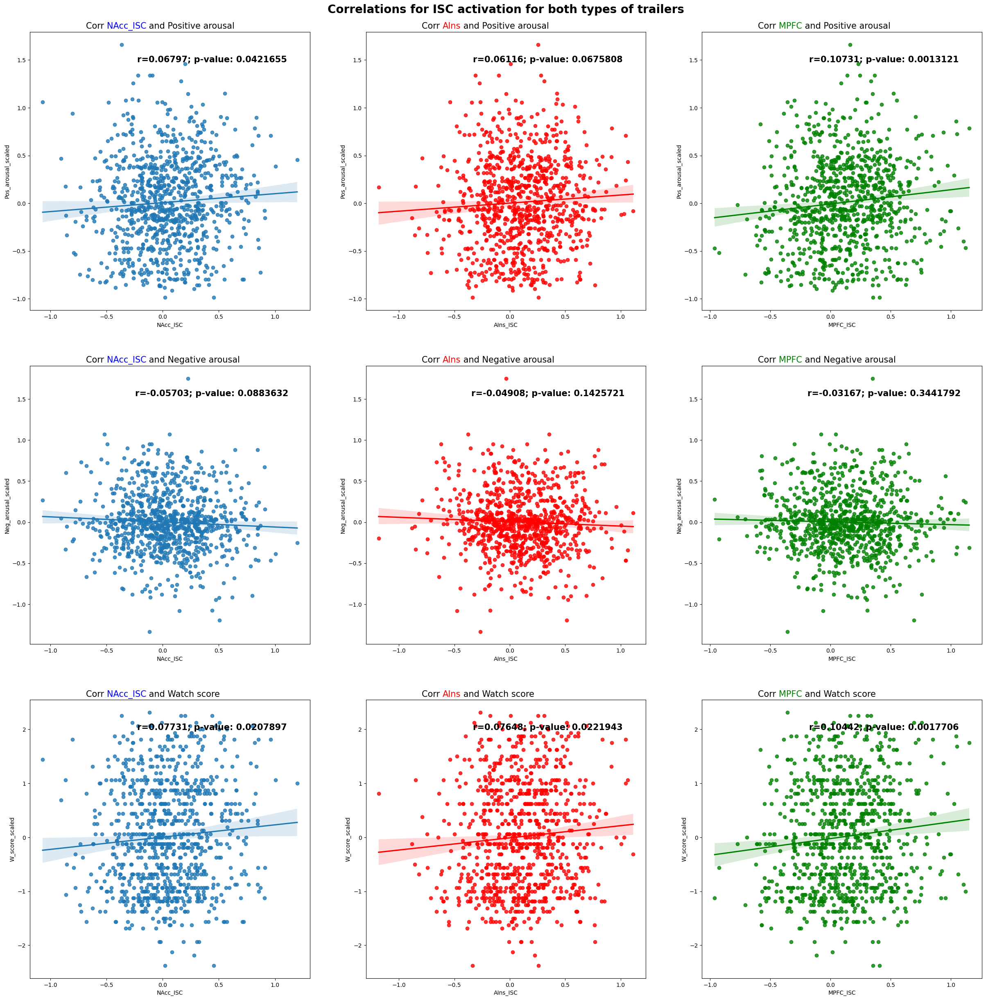

In [ ]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [ ]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.15067 with a p-value of: 0.0013815725027480122
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.09311 with a p-value of: 0.048895046638272
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.14575 with a p-value of: 0.001982990350192566

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: -0.08242 with a p-value of: 0.08141436030419008
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.06877 with a p-value of: 0.14617821581328436
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: -0.08183 with a p-value of: 0.08363431506659127

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.14474 with a p-value of: 0.0021313783851863183
For comedy trailers, the correlation 

In [ ]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.03588 with a p-value of: 0.4497544898146359
For horror trailers, the correlation between AIns ISC activation and positive arousal is: 0.02836 with a p-value of: 0.5503326633343948
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.06273 with a p-value of: 0.18603556905706448

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: -0.07091 with a p-value of: 0.1348813068216987
For horror trailers, the correlation between AIns ISC activation and negative arousal is: -0.00733 with a p-value of: 0.8773394517287795
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: 0.02199 with a p-value of: 0.6432369285669801

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.0073 with a p-value of: 0.877738022296358
For horror trailers, the correlation between AIn

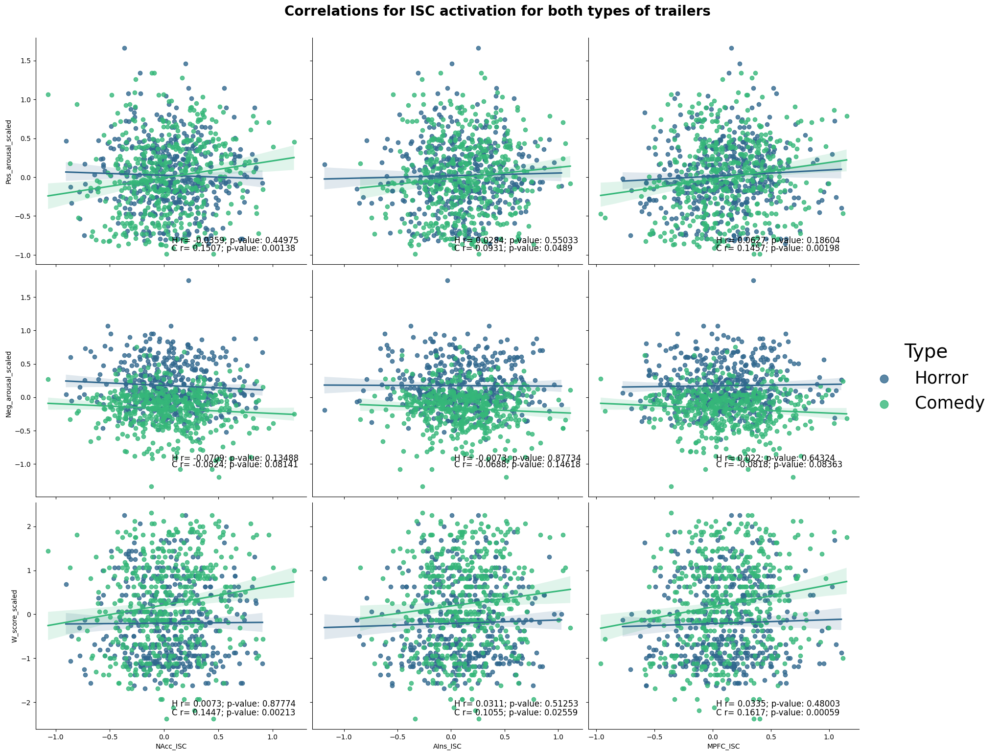

In [ ]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


In [ ]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData", os.O_RDONLY)


# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

root_path = os.getcwd()

Current working dir : /Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData


In [ ]:
# After dropping outliers from the neural activation data, save the new dataframe to a csv file.
# Calculate the mean measures for each trailer accross participants.
aggregate_df = all_subs_events_df.groupby("Trailer", as_index=False, dropna=False).mean()
aggregate_df.reset_index(inplace=True)

type_list = []
for id_trailer in range(len(aggregate_df)):
    if "c" in aggregate_df["Trailer"][id_trailer]:
        type_list.append("comedy")
    else:
        type_list.append("horror")

aggregate_df["Type"] = type_list

# I'm not sure why, but I am loosing the 'W_score' column. 
# I will add it back to the dataframe.
w_scores_dict = {}
for trailer_id in all_subs_events_df["Trailer"].unique():
    current_trailer_mean_w_score = all_subs_events_df[all_subs_events_df["Trailer"] == trailer_id]["W_score"].mean()
    w_scores_dict[trailer_id] = current_trailer_mean_w_score
    # Print scores as a sanity check.
    #print("For current trailer: " + trailer_id + " the mean W_score is: " + str(current_trailer_mean_w_score))

w_scores_list = []
for trailer_id in aggregate_df["Trailer"].unique():
    w_scores_list.append(w_scores_dict[trailer_id])

aggregate_df["W_score"] = w_scores_list


# Re-order columns.
cols_ordered = ['Trailer', 'Type', 'Onset', 'Offset', 'Pos_arousal', 'Neg_arousal',
        'Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score', 'W_score_scaled',
        'NAcc_onset', 'AIns_onset', 'MPFC_onset',
        'NAcc_middle', 'AIns_middle', 'MPFC_middle', 'NAcc_offset',
        'AIns_offset', 'MPFC_offset', 
        'NAcc_onset_z', 'AIns_onset_z', 'MPFC_onset_z', 'NAcc_middle_z',
        'AIns_middle_z', 'MPFC_middle_z', 'NAcc_offset_z', 'AIns_offset_z',
        'MPFC_offset_z', 'NAcc_whole', 'AIns_whole', 'MPFC_whole',
        'NAcc_whole_z', 'AIns_whole_z', 'MPFC_whole_z', 'NAcc_pos_peak',
        'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak',
        'MPFC_neg_peak', 'NAcc_slope_peak', 'AIns_slope_peak',
        'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg',
        'MPFC_slope_peak_avg', 'NAcc_narrow_slope_peak',
        'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
        'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg',
        'MPFC_narrow_slope_peak_avg', 'NAcc_delta_peak', 'AIns_delta_peak',
        'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
        'MPFC_delta_peak_avg', 'NAcc_narrow_delta_peak',
        'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
        'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg',
        'MPFC_narrow_delta_peak_avg', 'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC']

aggregate_df = aggregate_df[cols_ordered]

root_path = os.getcwd()

aggregate_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_clean.csv", index=True)
aggregate_df.head(40)

,Trailer,Type,Onset,Offset,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,...,MPFC_delta_peak_avg,NAcc_narrow_delta_peak,AIns_narrow_delta_peak,MPFC_narrow_delta_peak,NAcc_narrow_delta_peak_avg,AIns_narrow_delta_peak_avg,MPFC_narrow_delta_peak_avg,NAcc_ISC,AIns_ISC,MPFC_ISC
0,rc1,comedy,108.0,138.0,1.743382,-0.271740,0.329168,-0.271740,3.111111,0.868056,...,-0.010611,0.009550,0.006354,-0.022088,0.008083,0.006363,-0.005308,0.237596,0.126752,0.132190
1,rc10,comedy,568.0,598.0,1.411240,-0.172332,-0.002973,-0.172332,2.481481,0.229167,...,-0.001715,0.010861,0.010571,0.010040,0.008000,0.008415,0.007858,0.019425,0.049479,0.063930
2,rc11,comedy,512.0,542.0,1.188236,-0.095134,-0.225978,-0.095134,2.034483,-0.271552,...,0.006155,0.009334,0.009931,0.008764,0.007561,0.006698,0.008681,-0.143231,0.133123,0.010754
3,rc12,comedy,656.0,686.0,1.107939,-0.056291,-0.306274,-0.056291,1.857143,-0.468750,...,0.008478,0.019469,0.013867,-0.028184,0.014103,0.011833,-0.004467,-0.180982,-0.013763,0.043971
4,rc2,comedy,108.0,138.0,1.119529,-0.040632,-0.294685,-0.040632,1.892857,-0.410714,...,0.017082,0.009886,0.012757,0.014094,0.007739,0.011172,0.011768,-0.011164,0.206310,0.181226
5,rc3,comedy,12.0,42.0,1.472017,-0.273653,0.057803,-0.273653,2.740741,0.495370,...,0.009074,0.009094,0.008015,0.013456,0.007745,0.008609,0.016557,-0.056364,-0.009662,0.113631
6,rc4,comedy,332.0,362.0,1.759344,-0.303212,0.345130,-0.303212,3.250000,1.008929,...,0.004951,0.012408,0.000163,0.010426,0.008715,0.005730,0.010875,-0.025124,0.087380,0.149083
7,rc5,comedy,700.0,730.0,1.491029,-0.086234,0.076815,-0.086234,2.571429,0.276786,...,0.001854,0.012698,0.007903,0.006645,0.008049,0.008036,0.006695,0.083120,0.125812,0.284181
8,rc6,comedy,420.0,450.0,1.311689,-0.137432,-0.102525,-0.137432,2.310345,0.004310,...,0.004916,0.010733,-0.006666,0.009523,0.009871,0.003925,0.009635,0.070375,0.291519,0.280847
9,rc7,comedy,660.0,690.0,1.189010,-0.207433,-0.225204,-0.207433,2.142857,-0.098214,...,0.011259,0.013008,0.492844,0.008972,0.009304,0.169158,0.007317,0.161639,0.208064,0.077778


In [ ]:
# Read aggregate metrics dataframe. 
aggregate_metricts_path = "/Users/luisalvarez/Documents/SpanLab/Aggregate_meetrics_labeled.csv"

aggregate_metrics_df = pd.read_csv(aggregate_metricts_path)

# Remove nan.
aggregate_metrics_df.dropna(subset=['label'], inplace=True)
aggregate_metrics_df.reset_index(inplace=True)
aggregate_metrics_df

,index,number,title,label,year,Release time,genre,"released (1 = yes, 0 = no)",url to trailer,Domestic Gross,...,Domestic Openning,Theaters Num,Avg Domestic Opening,downloaded,video trimmed,audio extracted,Budget,Unnamed: 17,Unnamed: 18,"The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480"
0,0,1,Joy Ride,rc1,2023,July 7,comedy,1,https://youtu.be/jyI-AM5VXDo?si=mZtAKMiPG0Ac2myk,12897789.0,...,2611969.0,2820.0,926,NaN,NaN,NaN,NaN,NaN,NaN,"The pilot data collected by prolific, sample s..."
1,1,2,80 For Brady,rc2,2023,Feb 3,comedy,1,https://youtu.be/-UeGXB2NjR8?si=JU3SbpBjbO05o2xl,39330588.0,...,4625369.0,3912.0,1182,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,3,A Man Called Otto,rc3,2022,Dec 30,comedy,1,https://youtu.be/eFYUX9l-m5I,64267657.0,...,1555761.0,637.0,2442,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,4,Puss in Boots: The Last Wish,rc4,2022,Dec 21,comedy,1,https://youtu.be/RqrXhwS33yc?si=jhP7bbiB2SUukjNb,185535345.0,...,3200250.0,4099.0,781,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,5,Strays,rc5,2023,Aug 18,comedy,1,https://youtu.be/26Xq6_g2r6Q?si=W1w0lLc7rlqiJ8TI,23988885.0,...,3427540.0,3223.0,1063,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,7,Champions,rc6,2023,Mar 10,comedy,1,https://youtu.be/pCHiWnj5Oek?si=3Rq4Yp7lOL2GySLb,16271910.0,...,1820955.0,3030.0,601,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,8,Book Club: The Next Chapter,rc7,2023,May 12,comedy,1,https://youtu.be/i9k213d5FU0?si=B8j2urRDZmCpvSOJ,17556340.0,...,2142255.0,3508.0,611,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,10,11,No Hard Feelings,rc8,2023,23-Jun,comedy,1,https://youtu.be/P15S6ND8kbQ?si=gjAiNLYLM0PQdiXv,50452282.0,...,6352471.0,3208.0,1980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,11,12,House Party,rc9,2023,13-Jan,comedy,1,https://youtu.be/XgOP67mTgZg?si=r135es4jieCvHxg7,9002247.0,...,1409486.0,1400.0,1007,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,16,17,Easter Sunday,rc10,2022,5-Aug,comedy,1,https://youtu.be/YIixb42aJPg?si=W_YbI5jjV8SOzHAJ,13013690.0,...,2033045.0,3175.0,640,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Join both dataframes.
aggregate_combined_df = aggregate_df.set_index('Trailer').join(aggregate_metrics_df.set_index('label'))

aggregate_combined_df.dropna(subset=['Domestic Openning'], inplace=True)
aggregate_combined_df.reset_index(inplace=True)

aggregate_combined_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_Combined_clean.csv", index=False)

aggregate_combined_df.head(40)

,Trailer,Type,Onset,Offset,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,...,Domestic Openning,Theaters Num,Avg Domestic Opening,downloaded,video trimmed,audio extracted,Budget,Unnamed: 17,Unnamed: 18,"The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480"
0,rc1,comedy,108.0,138.0,1.743382,-0.271740,0.329168,-0.271740,3.111111,0.868056,...,2611969.0,2820.0,926,NaN,NaN,NaN,NaN,NaN,NaN,"The pilot data collected by prolific, sample s..."
1,rc10,comedy,568.0,598.0,1.411240,-0.172332,-0.002973,-0.172332,2.481481,0.229167,...,2033045.0,3175.0,640,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,rc11,comedy,512.0,542.0,1.188236,-0.095134,-0.225978,-0.095134,2.034483,-0.271552,...,3706845.0,3650.0,1016,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,rc12,comedy,656.0,686.0,1.107939,-0.056291,-0.306274,-0.056291,1.857143,-0.468750,...,1464923.0,2464.0,595,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,rc2,comedy,108.0,138.0,1.119529,-0.040632,-0.294685,-0.040632,1.892857,-0.410714,...,4625369.0,3912.0,1182,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,rc3,comedy,12.0,42.0,1.472017,-0.273653,0.057803,-0.273653,2.740741,0.495370,...,1555761.0,637.0,2442,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,rc4,comedy,332.0,362.0,1.759344,-0.303212,0.345130,-0.303212,3.250000,1.008929,...,3200250.0,4099.0,781,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,rc5,comedy,700.0,730.0,1.491029,-0.086234,0.076815,-0.086234,2.571429,0.276786,...,3427540.0,3223.0,1063,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,rc6,comedy,420.0,450.0,1.311689,-0.137432,-0.102525,-0.137432,2.310345,0.004310,...,1820955.0,3030.0,601,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,rc7,comedy,660.0,690.0,1.189010,-0.207433,-0.225204,-0.207433,2.142857,-0.098214,...,2142255.0,3508.0,611,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:

"""
# # Correlation with Positive Arousal.
# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# # Correlation with Negative Arousal.
# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# # Correlation with Watch Scores.
# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
# MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

# print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

# On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
# plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

# # Onset Neural Activation and PA-NA for Comedy Trailers.
# NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

# NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

# NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
# AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
# MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

# print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

# # Onset Neural Activation and PA-NA for Horror Trailers.
# NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

# NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

# NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
# AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
# MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

# print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

# On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
# On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
# plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")



"""


'\n# # Correlation with Positive Arousal.\n# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])\n\n# # Correlation with Negative Arousal.\n# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])\n\n# # Correlation with Watch Scores.\n# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])\n# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])\n# MPFC_